In [114]:
import torch 
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
torch.manual_seed(0)


In [99]:
def show_images(image_tensor, num_image = 25, size = (1, 28, 28)):
  image_unflat = image_tensor.detach().cpu().view(-1, *size)
  image_grid = make_grid(image_unflat[:num_image], nrow= 5)
  plt.imshow(image_grid.permute(1,2,0).squeeze())
  plt.show()

In [100]:
def get_generator_block(input_dim, output_dim):
  return nn.Sequential(
      nn.Linear(input_dim, output_dim),
      nn.BatchNorm1d(output_dim),
      nn.ReLU(inplace = True)
     )

In [101]:
class Generator(nn.Module):
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),

            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
        )
    def forward(self, noise):
        return self.gen(noise)
    
    def get_gen(self):
        return self.gen

In [102]:
def get_noise(n_samples, z_dim, device = 'cpu'):
  return torch.randn((n_samples, z_dim), device = device)

In [103]:
def get_discriminator_block(input_dim, output_dim):
  return nn.Sequential(
      nn.Linear(input_dim, output_dim),
      nn.LeakyReLU(negative_slope= 0.2, inplace = True)
    )

In [104]:
class Discriminator(nn.Module):
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),

            nn.Linear(hidden_dim, 1)
        )

    def forward(self, image):
        return self.disc(image)
    
    def get_disc(self):
        return self.disc

In [116]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.001
device = 'cuda'

dataloader = DataLoader(MNIST('.', download = True, transform=transforms.ToTensor()), 
                         batch_size = batch_size, shuffle = True)

In [106]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr = lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [107]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):

  noise = get_noise(num_images, z_dim, device)
  fake_loss = criterion(disc(gen(noise).detach()), torch.zeros(num_images, 1).to(device))
  real_loss = criterion(disc(real), torch.ones(num_images, 1).to(device))
  disc_loss = (fake_loss + real_loss) / 2
  return disc_loss

In [110]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):

  noise = get_noise(num_images, z_dim, device)
  return criterion(disc(gen(noise)), torch.ones(num_images, 1).to(device))

Step 500: Generator loss: 14.858841673851007, discriminator loss: 0.09973857242925452


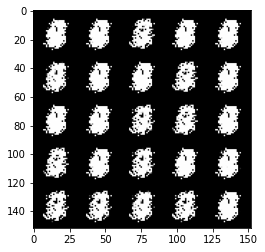

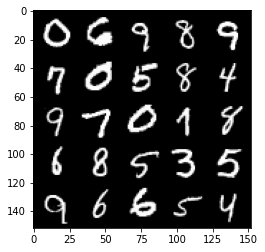

Step 1000: Generator loss: 13.403190342903137, discriminator loss: 0.06495687718270345


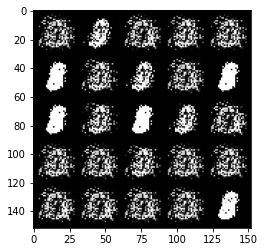

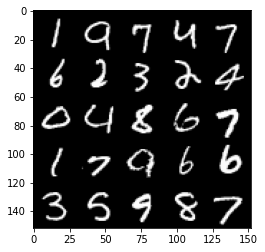

Step 1500: Generator loss: 13.433074758529667, discriminator loss: 0.027965883004886578


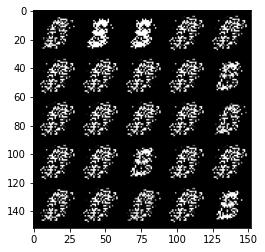

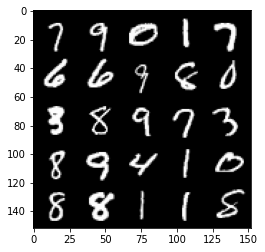

Step 2000: Generator loss: 12.14596207332611, discriminator loss: 0.08204408918227998


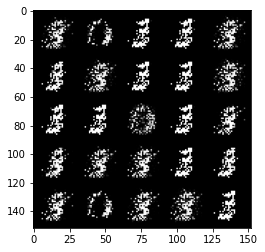

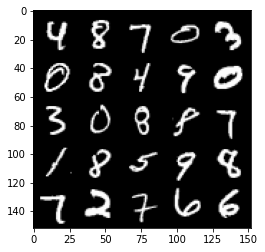

Step 2500: Generator loss: 10.920885413169852, discriminator loss: 0.058979879151098404


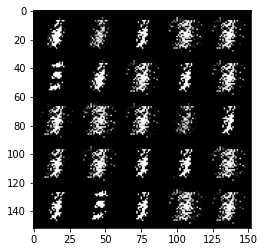

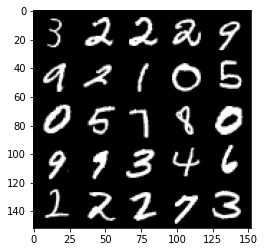

Step 3000: Generator loss: 9.688349737167366, discriminator loss: 0.08901303441915663


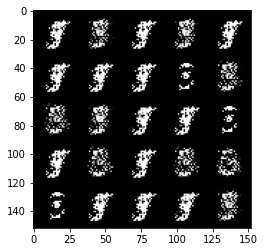

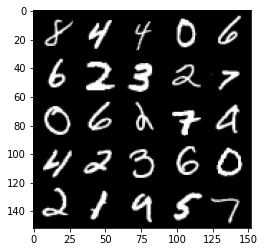

Step 3500: Generator loss: 9.332828556060786, discriminator loss: 0.110650231493637


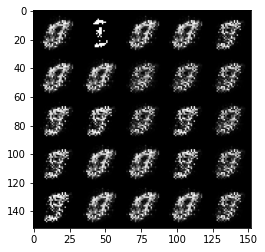

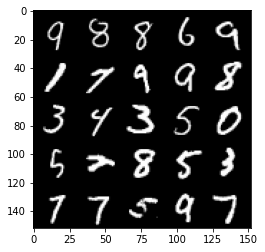

Step 4000: Generator loss: 6.6423950638771085, discriminator loss: 0.12856641976721592


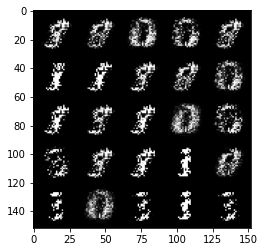

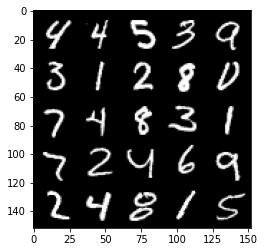

Step 4500: Generator loss: 7.087794227600092, discriminator loss: 0.16107876989245415


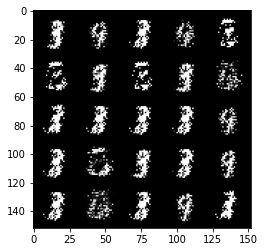

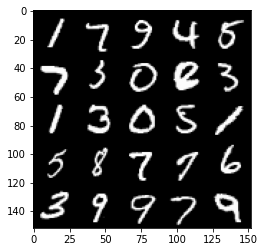

Step 5000: Generator loss: 7.555837783813483, discriminator loss: 0.14728942301869385


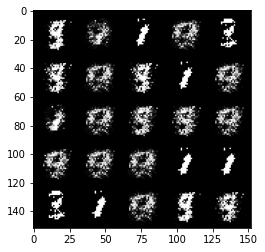

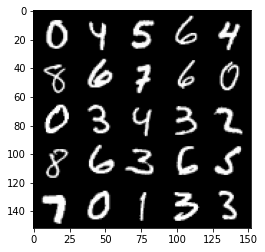

Step 5500: Generator loss: 6.1569014596939065, discriminator loss: 0.1417066361829639


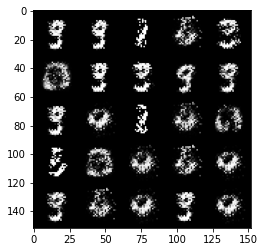

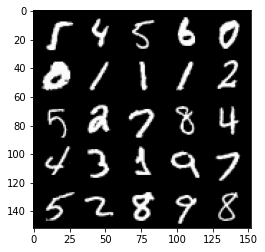

Step 6000: Generator loss: 5.582258018016817, discriminator loss: 0.19270764959603554


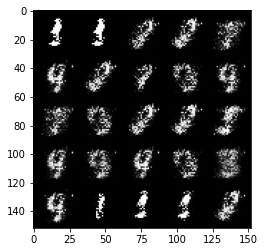

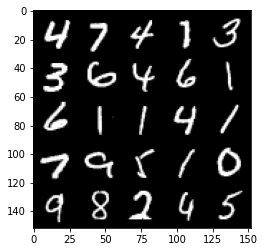

Step 6500: Generator loss: 4.973513329029078, discriminator loss: 0.18649851205199966


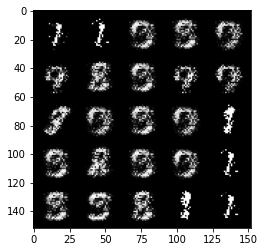

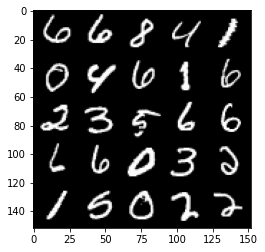

Step 7000: Generator loss: 5.7994661207199165, discriminator loss: 0.1823035616427659


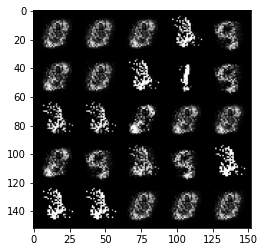

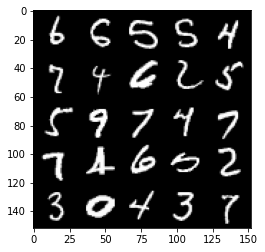

Step 7500: Generator loss: 6.501942333698274, discriminator loss: 0.15995737222395834


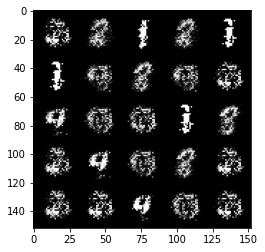

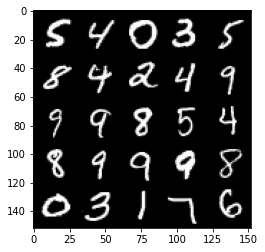

Step 8000: Generator loss: 5.386974352359771, discriminator loss: 0.19767654059827344


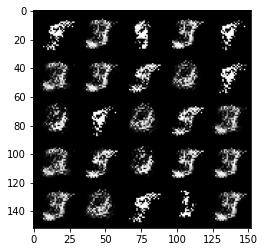

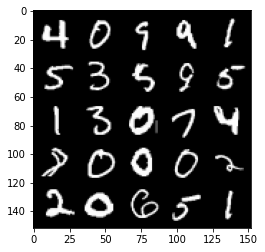

Step 8500: Generator loss: 4.598820500373844, discriminator loss: 0.21736384269595163


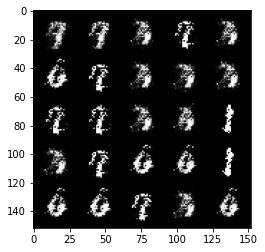

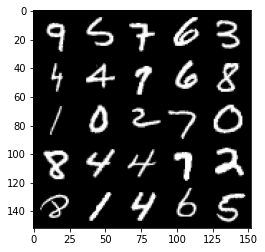

Step 9000: Generator loss: 4.765628364086155, discriminator loss: 0.24395294770598436


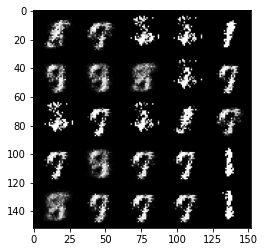

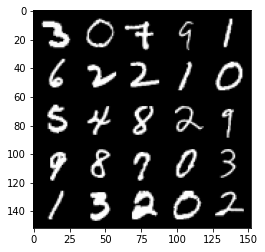

Step 9500: Generator loss: 4.203429094791412, discriminator loss: 0.23852433374524087


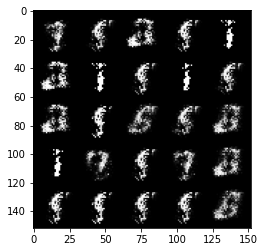

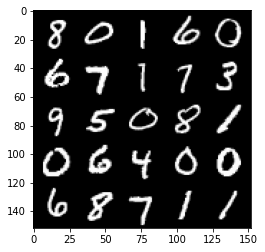

Step 10000: Generator loss: 4.658259932518003, discriminator loss: 0.21494092446565638


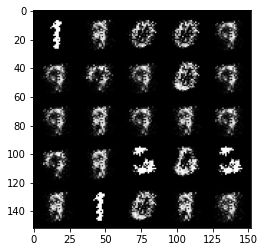

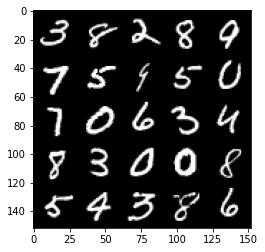

Step 10500: Generator loss: 4.811692156791684, discriminator loss: 0.18885066562890993


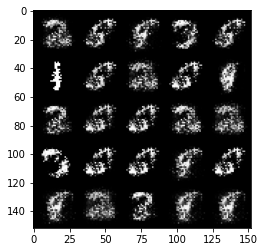

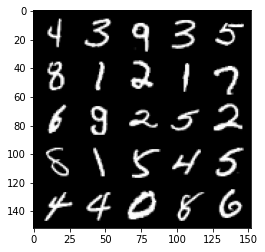

Step 11000: Generator loss: 4.5741983199119565, discriminator loss: 0.250483063556254


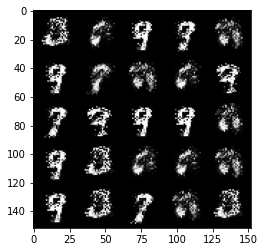

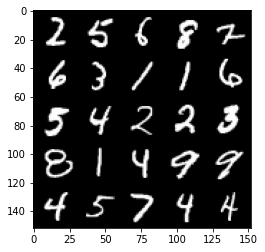

Step 11500: Generator loss: 4.2122639718055686, discriminator loss: 0.22690018745511753


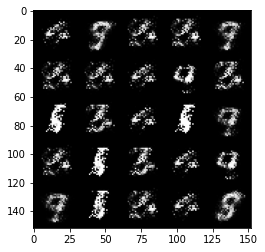

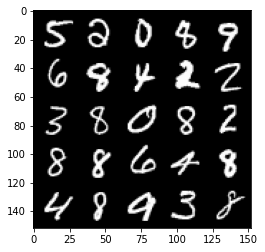

Step 12000: Generator loss: 3.8647427060604103, discriminator loss: 0.28651005193591117


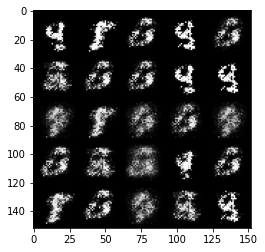

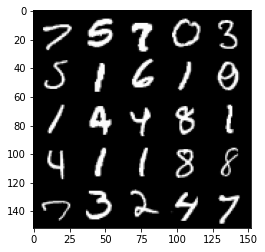

Step 12500: Generator loss: 4.180576682806017, discriminator loss: 0.2749882079809904


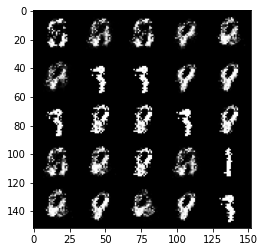

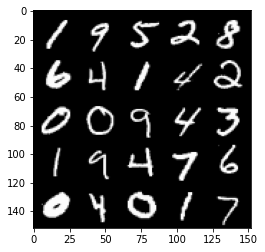

Step 13000: Generator loss: 4.388895836830137, discriminator loss: 0.21735500214993947


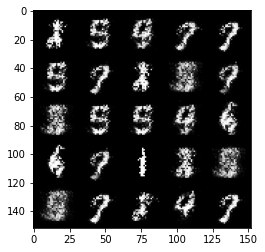

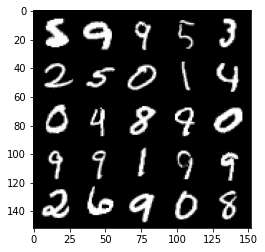

Step 13500: Generator loss: 4.1309511110782635, discriminator loss: 0.24921799193322647


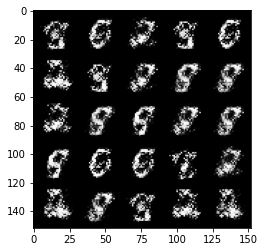

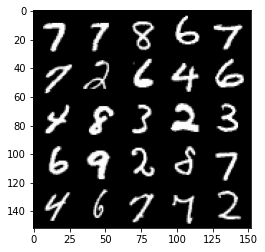

Step 14000: Generator loss: 4.4502065086364695, discriminator loss: 0.23575149133056394


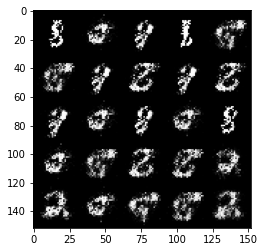

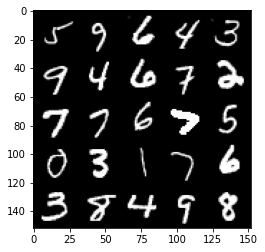

Step 14500: Generator loss: 4.421965617656708, discriminator loss: 0.2356182388067246


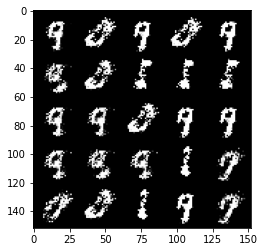

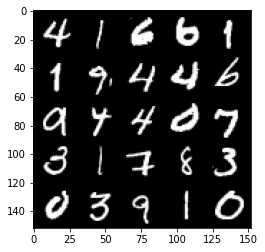

Step 15000: Generator loss: 4.024772242069243, discriminator loss: 0.2746377697139974


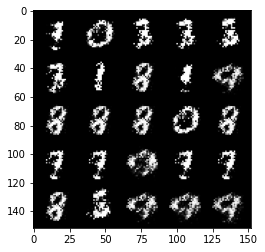

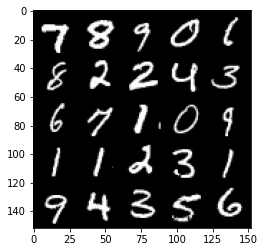

Step 15500: Generator loss: 3.60907318353653, discriminator loss: 0.2685433403104541


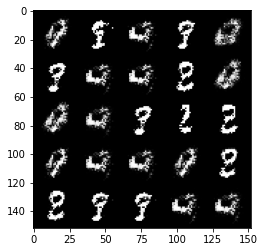

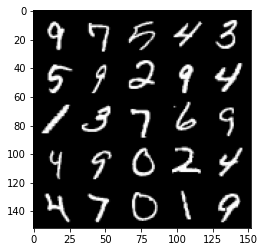

Step 16000: Generator loss: 3.834414422035216, discriminator loss: 0.25395069685578353


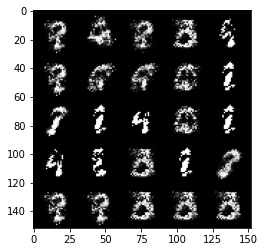

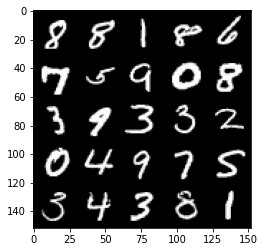

Step 16500: Generator loss: 3.7449797983169546, discriminator loss: 0.24754746663570407


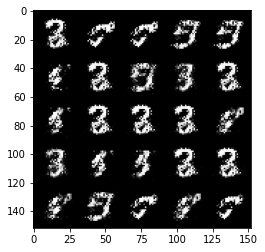

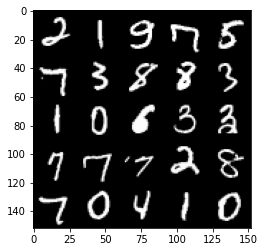

Step 17000: Generator loss: 4.424184435367587, discriminator loss: 0.2050644157156348


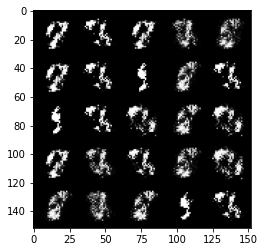

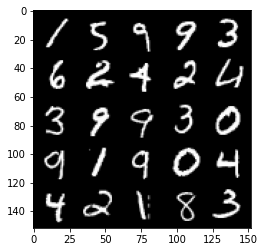

Step 17500: Generator loss: 4.335926975727083, discriminator loss: 0.2520520445927977


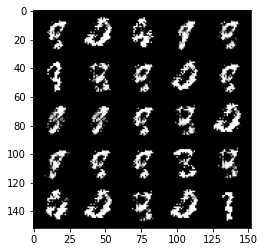

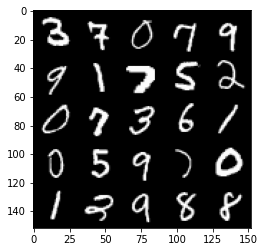

Step 18000: Generator loss: 4.272704456806183, discriminator loss: 0.24208220078051118


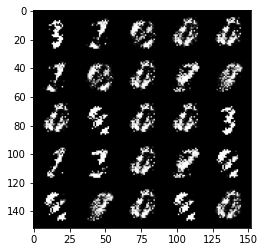

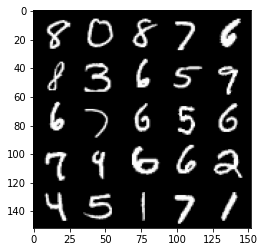

Step 18500: Generator loss: 3.935693642616272, discriminator loss: 0.2342090113312006


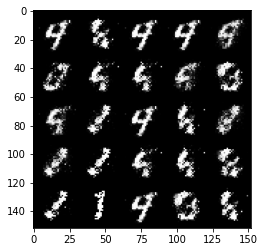

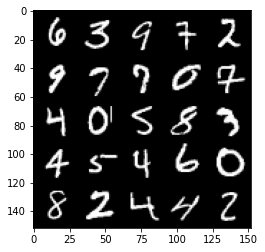

Step 19000: Generator loss: 4.3738408498764025, discriminator loss: 0.2575023962408303


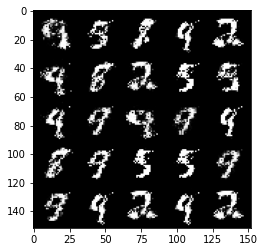

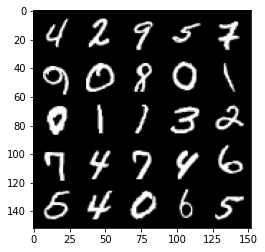

Step 19500: Generator loss: 4.367741414546962, discriminator loss: 0.2192045403271913


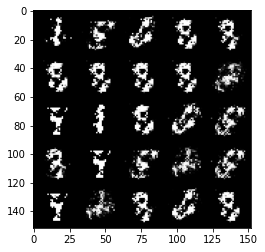

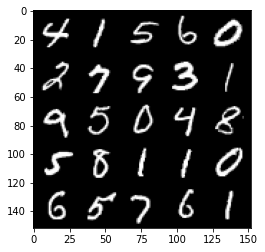

Step 20000: Generator loss: 4.046799110889432, discriminator loss: 0.23844043989479535


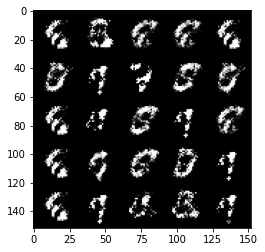

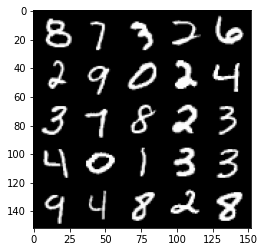

Step 20500: Generator loss: 4.363108671188352, discriminator loss: 0.24848906478285776


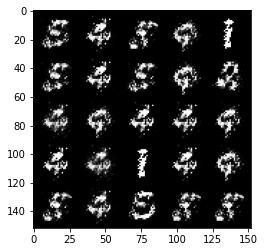

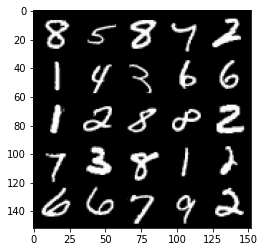

Step 21000: Generator loss: 4.604479800701142, discriminator loss: 0.2332908148467537


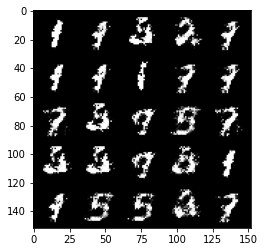

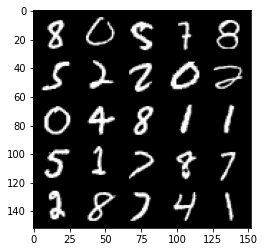

Step 21500: Generator loss: 4.332102660894392, discriminator loss: 0.2553452034816148


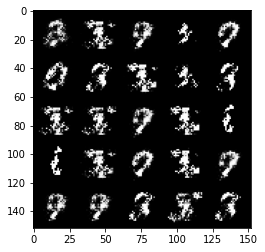

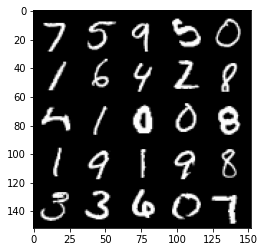

Step 22000: Generator loss: 3.883884777545928, discriminator loss: 0.2519839376807215


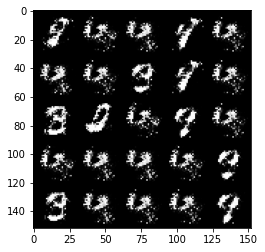

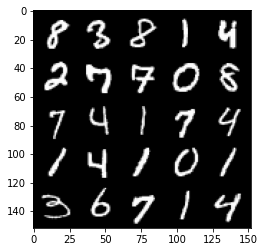

Step 22500: Generator loss: 4.284792122840885, discriminator loss: 0.22774419254064537


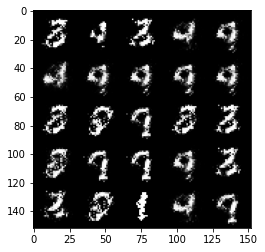

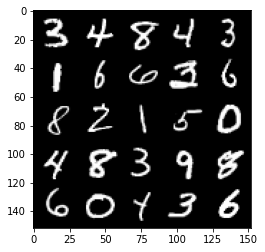

Step 23000: Generator loss: 3.932095322132112, discriminator loss: 0.2534957372397184


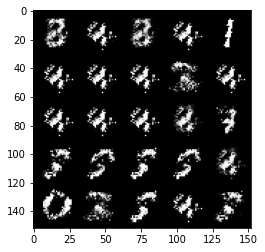

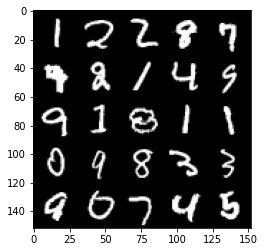

Step 23500: Generator loss: 4.1652332859039305, discriminator loss: 0.24275507402420043


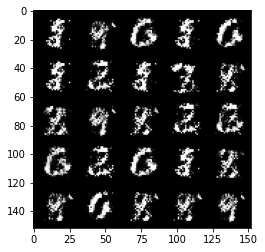

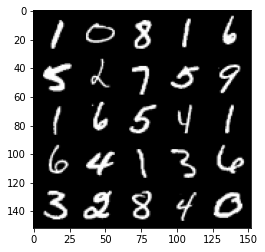

Step 24000: Generator loss: 4.112809833526609, discriminator loss: 0.22751297084987146


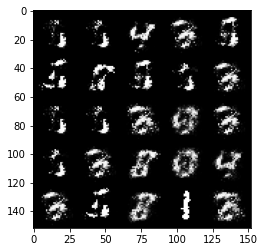

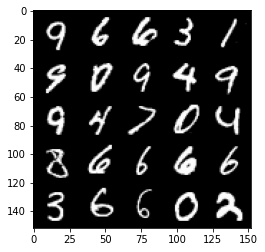

Step 24500: Generator loss: 4.242822639465334, discriminator loss: 0.19386301888525487


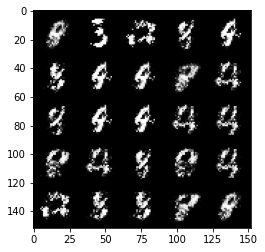

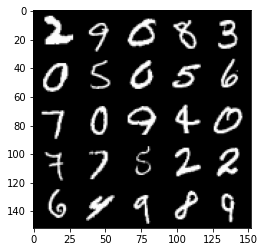

Step 25000: Generator loss: 4.226655053615571, discriminator loss: 0.19599066290259362


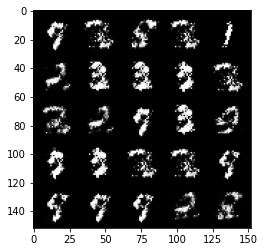

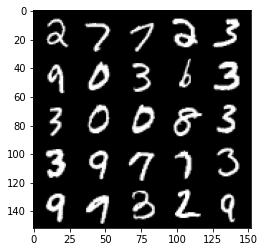

Step 25500: Generator loss: 4.3518350496292095, discriminator loss: 0.22036431460082534


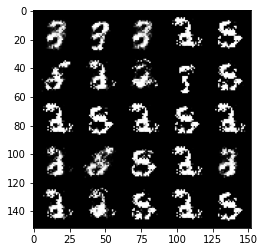

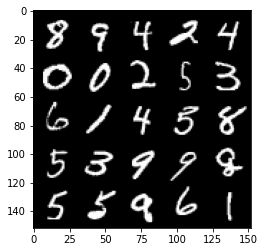

Step 26000: Generator loss: 4.417223748683934, discriminator loss: 0.23922982816398145


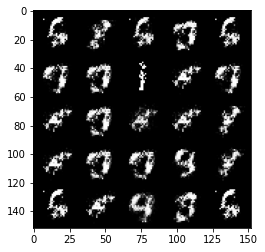

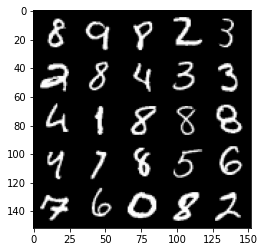

Step 26500: Generator loss: 4.089408449649813, discriminator loss: 0.23725911266356703


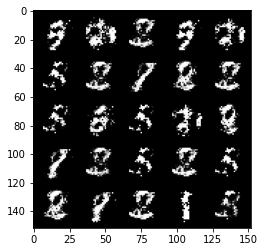

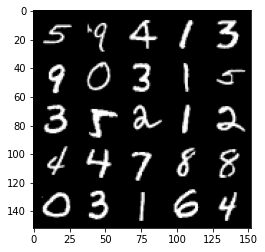

Step 27000: Generator loss: 4.132259617805478, discriminator loss: 0.22689341928064835


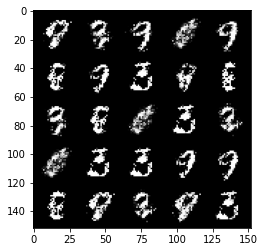

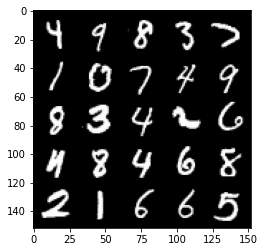

Step 27500: Generator loss: 3.956705321788788, discriminator loss: 0.26082029362022896


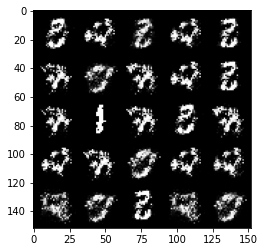

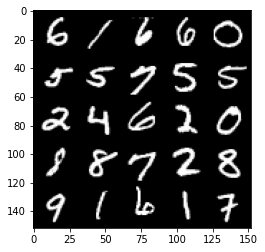

Step 28000: Generator loss: 3.711599503040309, discriminator loss: 0.253570685863495


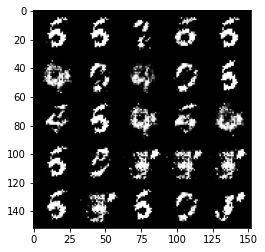

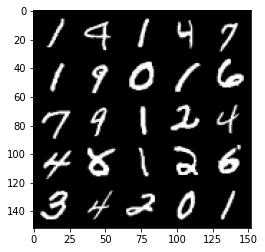

Step 28500: Generator loss: 4.02071748781204, discriminator loss: 0.23862352339923387


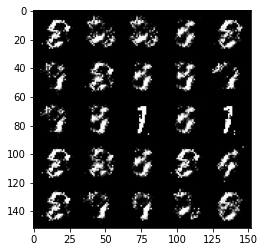

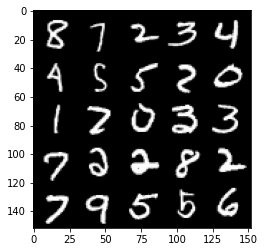

Step 29000: Generator loss: 4.116503814697265, discriminator loss: 0.22706249774992454


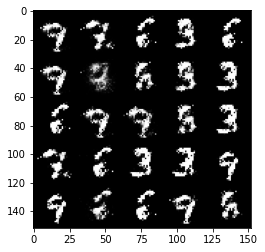

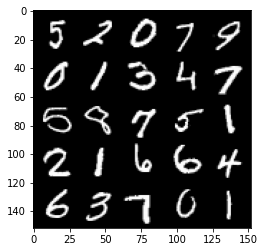

Step 29500: Generator loss: 4.091055277824402, discriminator loss: 0.23155732434988024


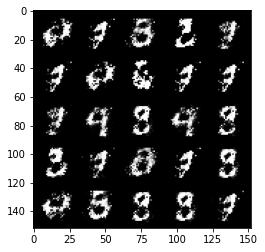

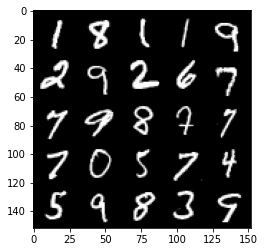

Step 30000: Generator loss: 4.497512815475466, discriminator loss: 0.21037443792074922


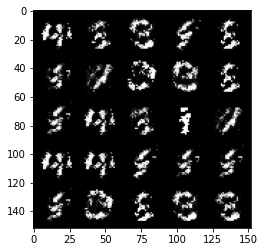

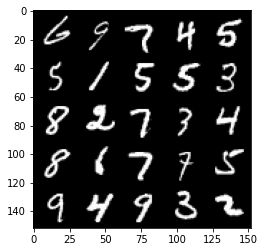

Step 30500: Generator loss: 4.879232209205627, discriminator loss: 0.16898883749544613


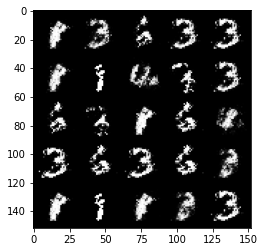

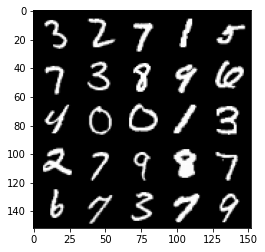

Step 31000: Generator loss: 4.85940850663185, discriminator loss: 0.2008403371088206


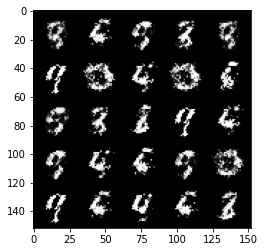

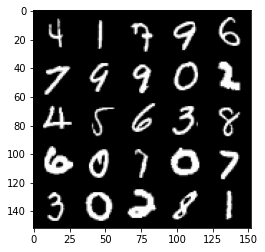

Step 31500: Generator loss: 4.127589089155199, discriminator loss: 0.21547629001736657


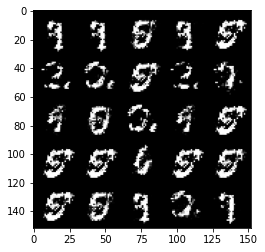

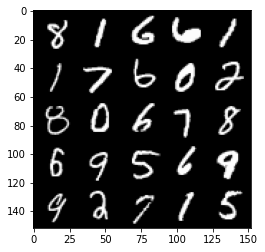

Step 32000: Generator loss: 5.05978916788101, discriminator loss: 0.21957239992171532


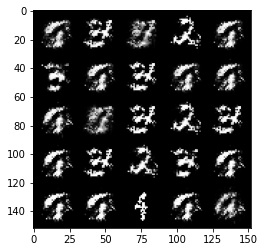

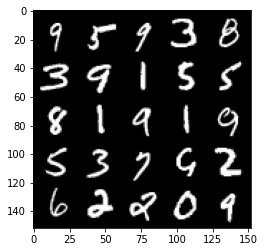

Step 32500: Generator loss: 4.554985180377955, discriminator loss: 0.20320284385234136


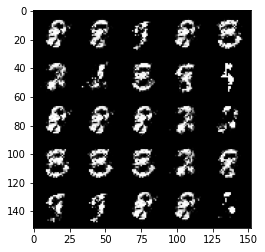

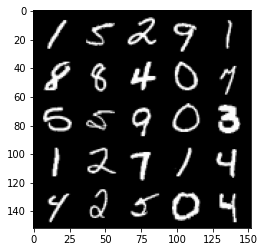

Step 33000: Generator loss: 4.458334277153017, discriminator loss: 0.18571917510777697


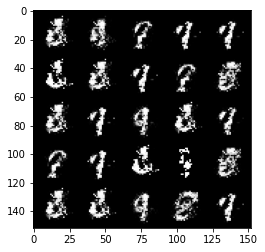

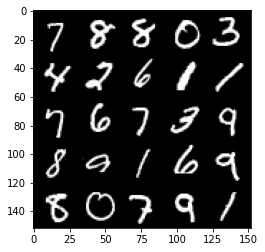

Step 33500: Generator loss: 4.939721285820008, discriminator loss: 0.21125343619287001


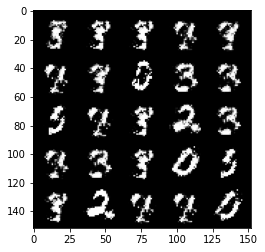

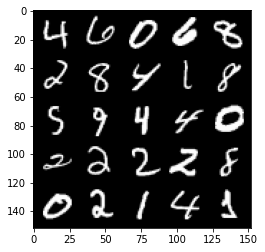

Step 34000: Generator loss: 4.219671787738796, discriminator loss: 0.21262381562590627


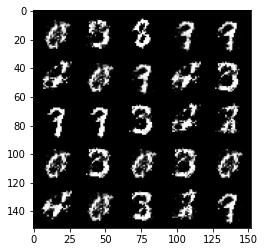

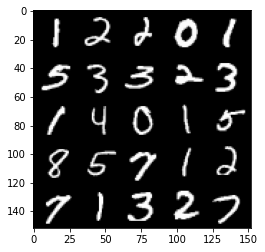

Step 34500: Generator loss: 5.044692806720732, discriminator loss: 0.19265207432582968


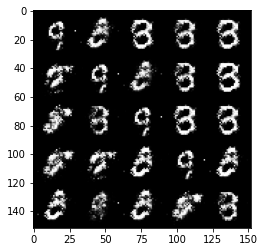

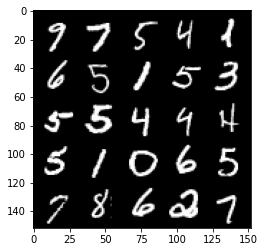

Step 35000: Generator loss: 4.453730121135712, discriminator loss: 0.24070342513918877


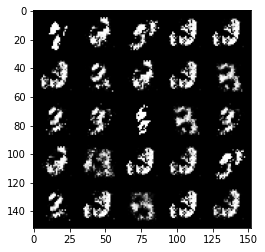

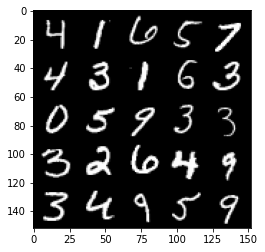

Step 35500: Generator loss: 4.589199077129365, discriminator loss: 0.19296348366886365


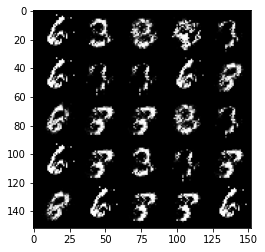

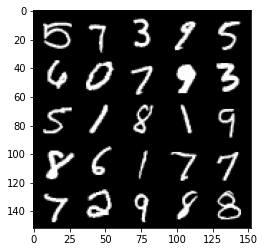

Step 36000: Generator loss: 4.596119402885436, discriminator loss: 0.19037084934860493


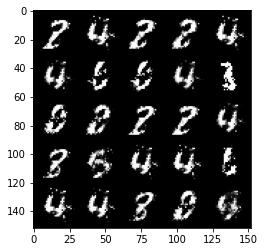

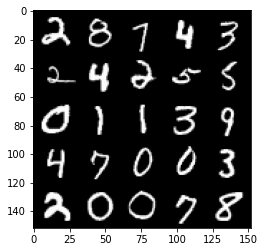

Step 36500: Generator loss: 4.4182625665664625, discriminator loss: 0.22036640617251377


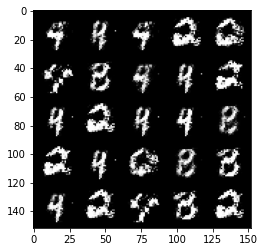

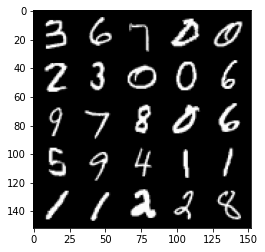

Step 37000: Generator loss: 4.404828611373904, discriminator loss: 0.2005501911267638


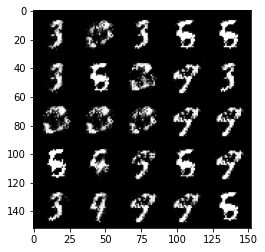

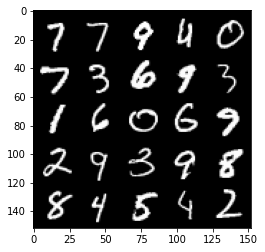

Step 37500: Generator loss: 4.235287292242046, discriminator loss: 0.2117114999443292


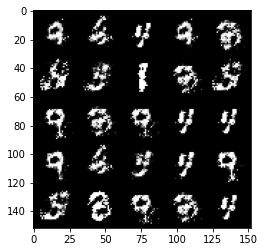

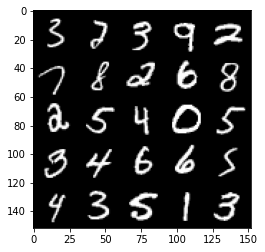

Step 38000: Generator loss: 4.362219499588016, discriminator loss: 0.21557263783365505


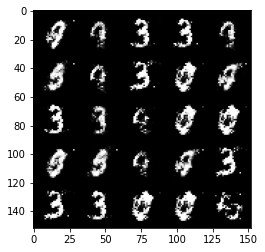

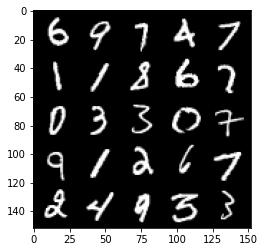

Step 38500: Generator loss: 4.344615101814271, discriminator loss: 0.21187622880935675


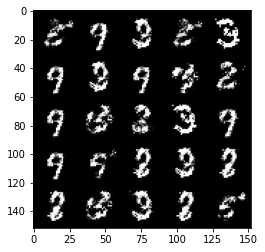

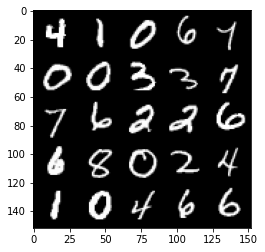

Step 39000: Generator loss: 4.587195849895477, discriminator loss: 0.2149690465033057


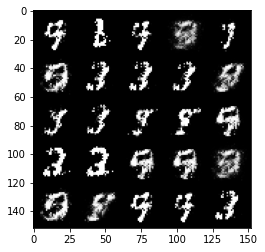

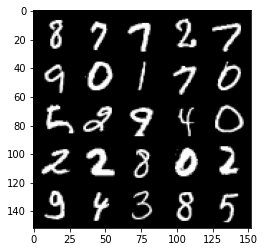

Step 39500: Generator loss: 4.551558220624924, discriminator loss: 0.22562369801849158


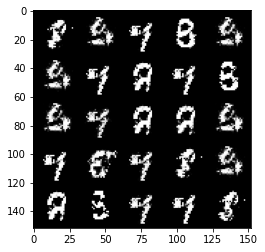

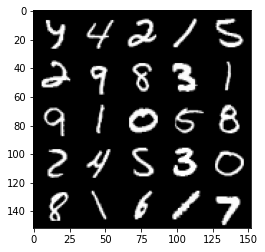

Step 40000: Generator loss: 4.590092426538464, discriminator loss: 0.21195359654724605


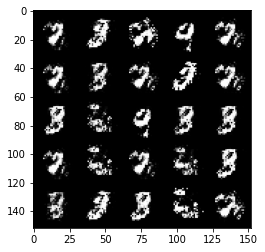

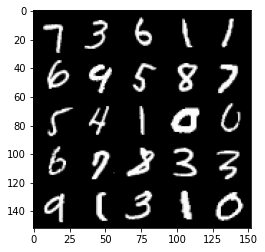

Step 40500: Generator loss: 4.613475024461744, discriminator loss: 0.2047535578235983


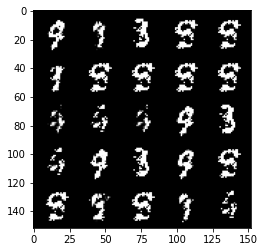

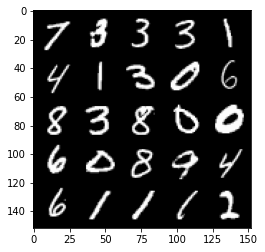

Step 41000: Generator loss: 5.09314743280411, discriminator loss: 0.15526835967600353


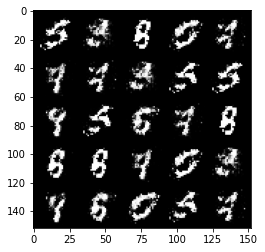

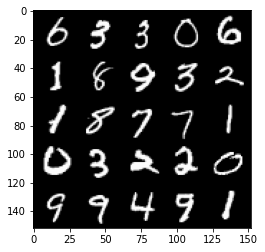

Step 41500: Generator loss: 4.5251274507045744, discriminator loss: 0.22826517762988818


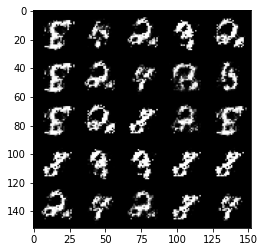

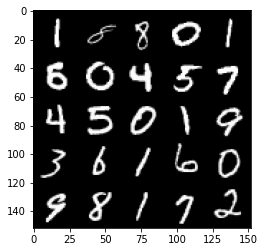

Step 42000: Generator loss: 4.843691399812705, discriminator loss: 0.18939140244573377


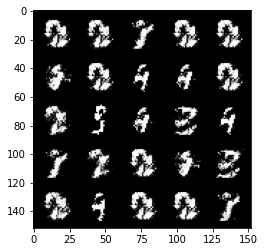

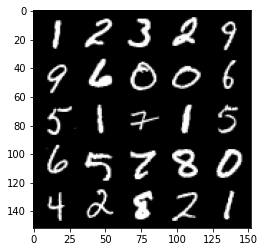

Step 42500: Generator loss: 4.956187993526458, discriminator loss: 0.22179075619578378


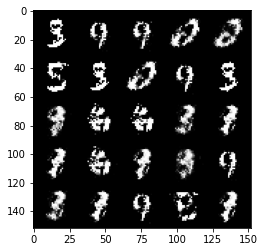

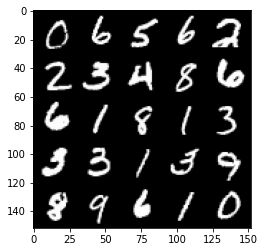

Step 43000: Generator loss: 4.705158188343051, discriminator loss: 0.18311907485127454


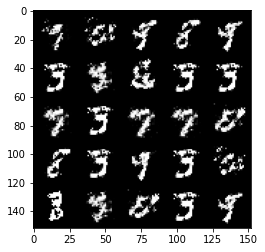

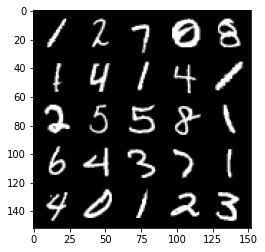

Step 43500: Generator loss: 4.871180366992948, discriminator loss: 0.19911170670390113


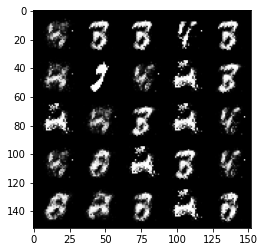

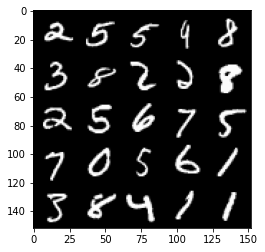

Step 44000: Generator loss: 5.08248166418076, discriminator loss: 0.184927423082292


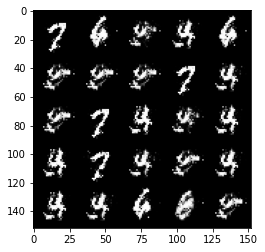

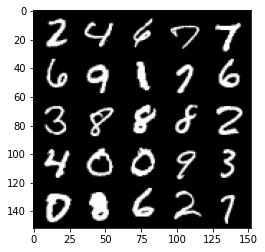

Step 44500: Generator loss: 4.554359828948976, discriminator loss: 0.14142421285063037


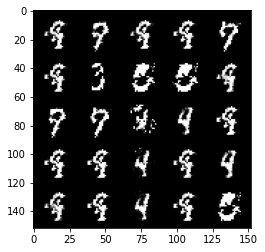

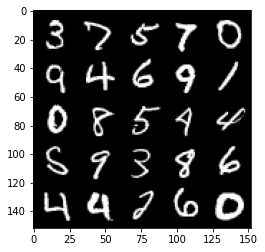

Step 45000: Generator loss: 5.214305107116698, discriminator loss: 0.1982794445827602


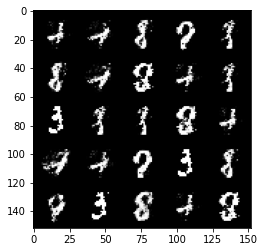

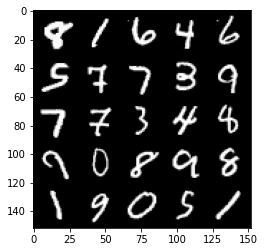

Step 45500: Generator loss: 4.981657588481898, discriminator loss: 0.21066716475784789


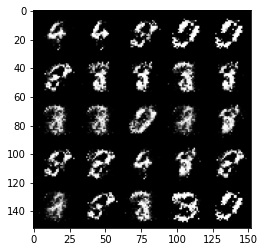

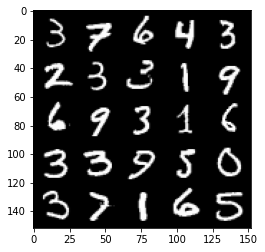

Step 46000: Generator loss: 4.755684010028839, discriminator loss: 0.1705988557487727


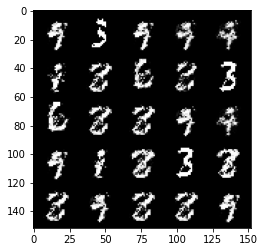

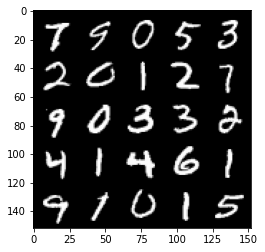

Step 46500: Generator loss: 4.73376978588104, discriminator loss: 0.18058147893100987


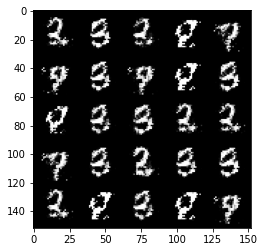

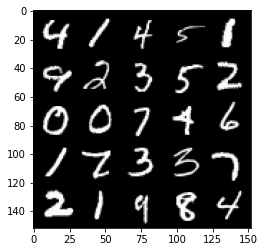

Step 47000: Generator loss: 4.554756630897524, discriminator loss: 0.18508986497670424


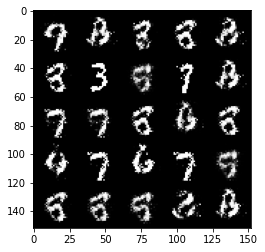

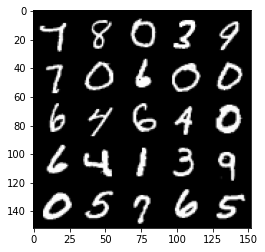

Step 47500: Generator loss: 4.986482311725622, discriminator loss: 0.19178926729410878


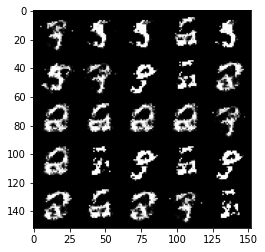

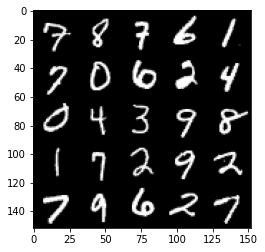

Step 48000: Generator loss: 4.788547382354737, discriminator loss: 0.16586100224405534


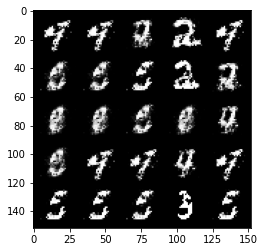

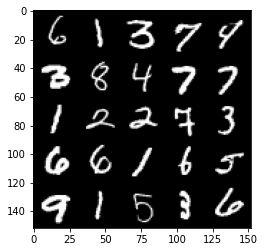

Step 48500: Generator loss: 4.46593933773041, discriminator loss: 0.16545820743590622


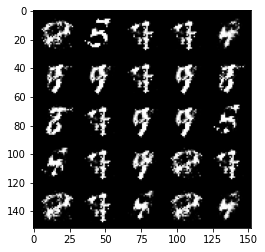

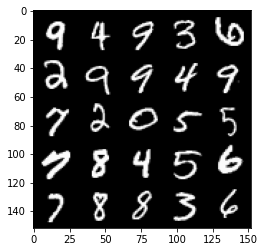

Step 49000: Generator loss: 6.014310365200044, discriminator loss: 0.1546774361878633


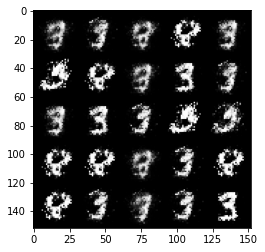

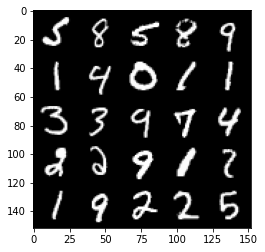

Step 49500: Generator loss: 5.671712649345399, discriminator loss: 0.10558495201542972


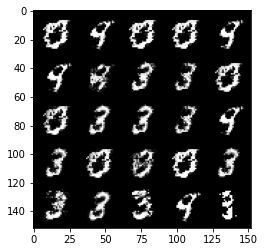

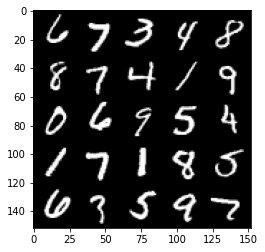

Step 50000: Generator loss: 5.5734659459590965, discriminator loss: 0.1861293461695316


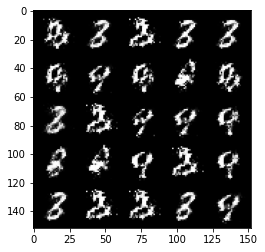

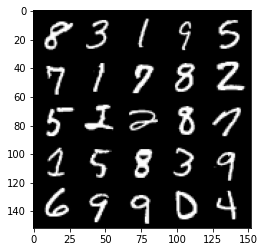

Step 50500: Generator loss: 4.957370406150817, discriminator loss: 0.1533298432789742


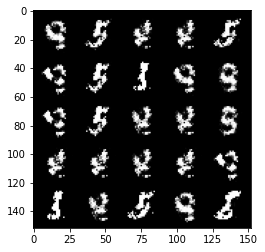

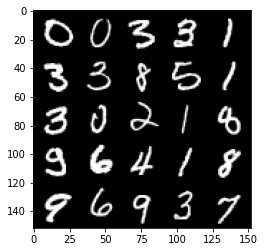

Step 51000: Generator loss: 5.80474786758422, discriminator loss: 0.13426516353711498


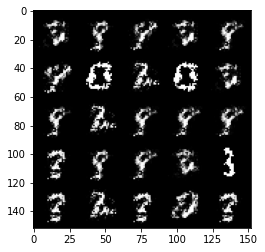

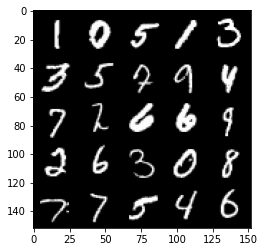

Step 51500: Generator loss: 5.466018851995467, discriminator loss: 0.19345970349013814


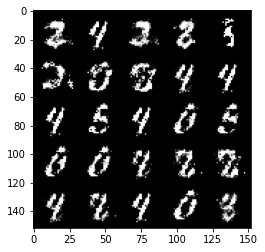

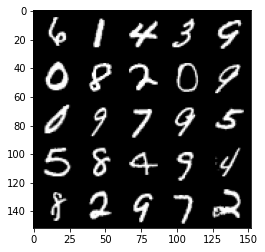

Step 52000: Generator loss: 4.773787623882295, discriminator loss: 0.19707388883829136


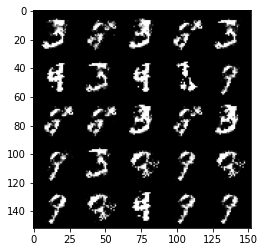

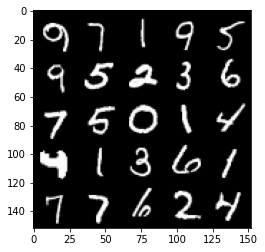

Step 52500: Generator loss: 4.695805908203128, discriminator loss: 0.17642640813440086


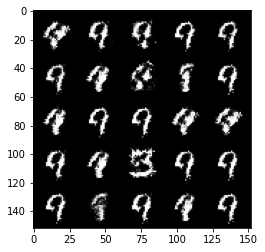

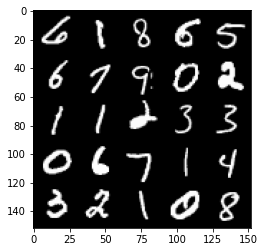

Step 53000: Generator loss: 4.988088073253635, discriminator loss: 0.17425490155071008


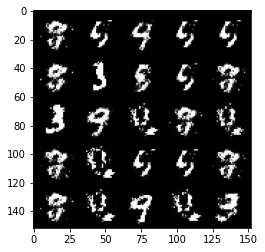

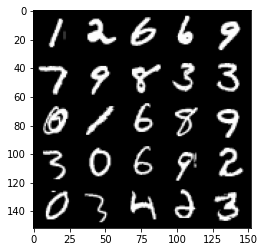

Step 53500: Generator loss: 5.073654830932619, discriminator loss: 0.13148187962546934


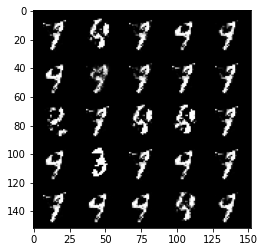

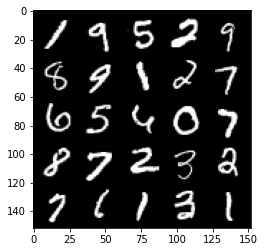

Step 54000: Generator loss: 5.486501730442048, discriminator loss: 0.13846742533519857


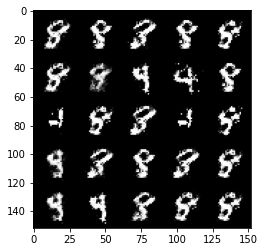

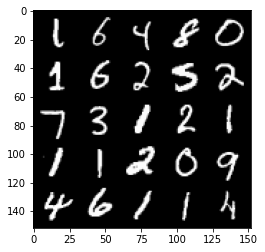

Step 54500: Generator loss: 5.3388340606689395, discriminator loss: 0.13423721039667721


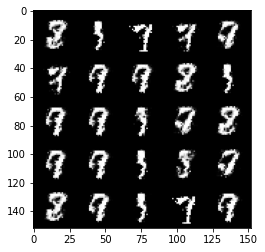

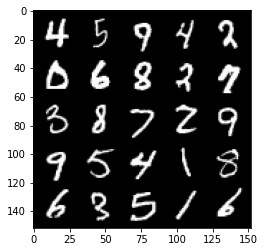

Step 55000: Generator loss: 5.742528234004973, discriminator loss: 0.13705874936096393


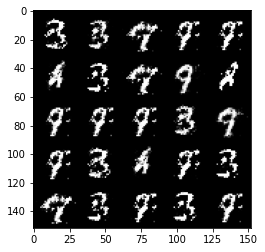

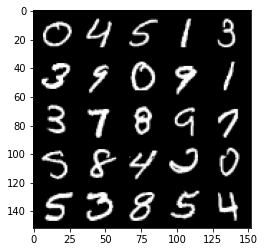

Step 55500: Generator loss: 4.81763433647156, discriminator loss: 0.1797749049216508


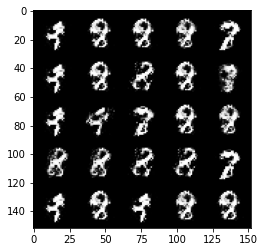

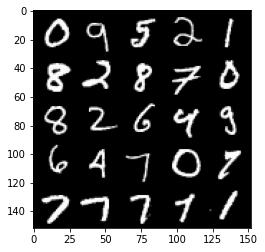

Step 56000: Generator loss: 5.152784742355346, discriminator loss: 0.13011796698346745


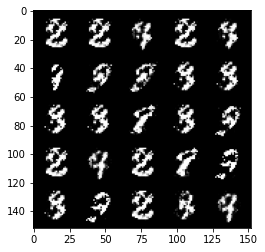

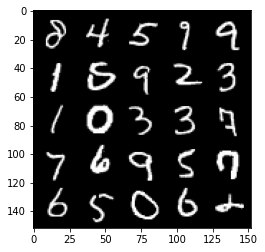

Step 56500: Generator loss: 5.558807570934301, discriminator loss: 0.18189675597101448


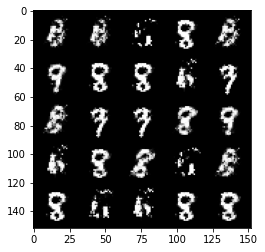

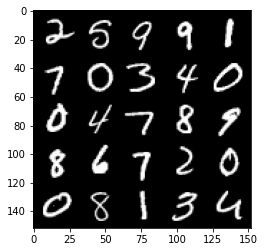

Step 57000: Generator loss: 5.100500067234036, discriminator loss: 0.14826706191897376


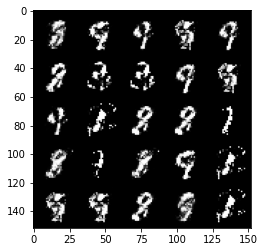

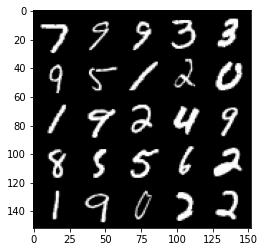

Step 57500: Generator loss: 6.087024847984314, discriminator loss: 0.12388653868064292


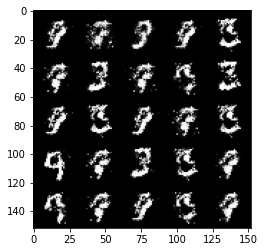

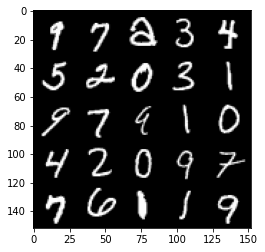

Step 58000: Generator loss: 5.847813268899911, discriminator loss: 0.11208392605930569


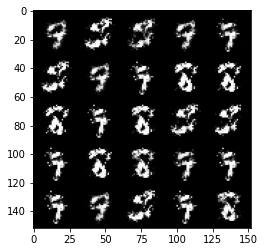

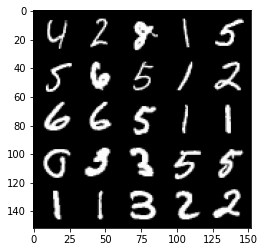

Step 58500: Generator loss: 7.0504962387084875, discriminator loss: 0.11403072587773203


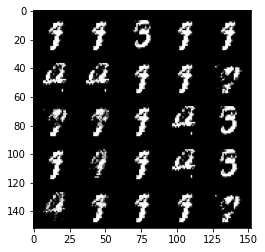

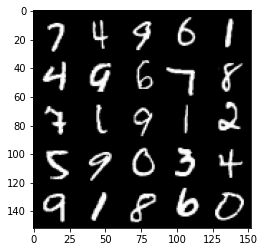

Step 59000: Generator loss: 6.205140040397639, discriminator loss: 0.09241446381155395


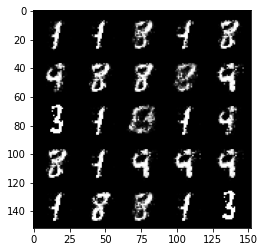

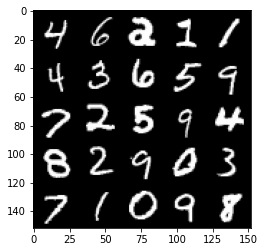

Step 59500: Generator loss: 6.232575719833381, discriminator loss: 0.1136575756426899


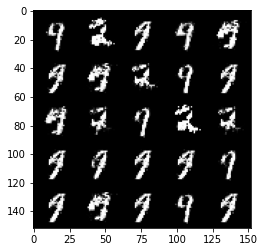

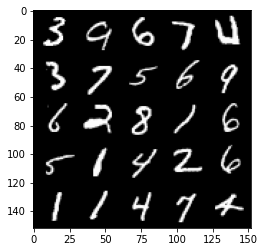

Step 60000: Generator loss: 5.87311524271965, discriminator loss: 0.19448015880212194


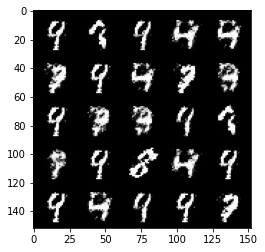

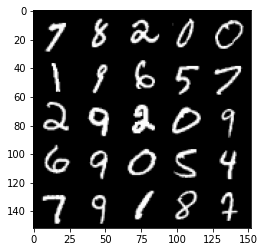

Step 60500: Generator loss: 5.2289801175594315, discriminator loss: 0.15706253979727652


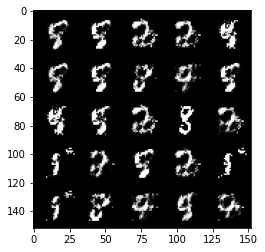

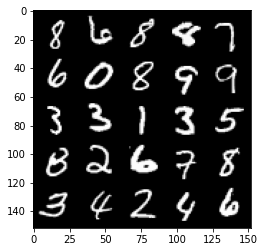

Step 61000: Generator loss: 5.5886329731941276, discriminator loss: 0.1416882701627911


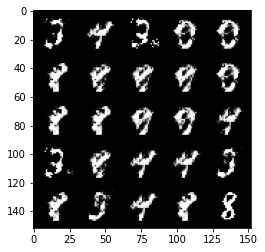

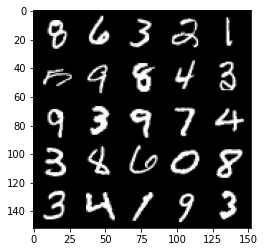

Step 61500: Generator loss: 5.453577033519747, discriminator loss: 0.12306646552309394


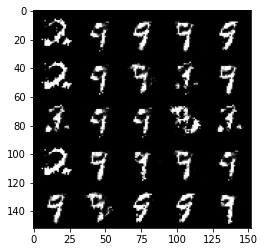

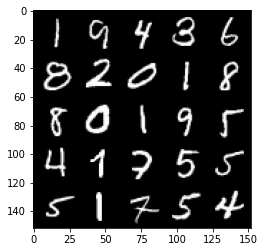

Step 62000: Generator loss: 6.087094528198241, discriminator loss: 0.10526836822228514


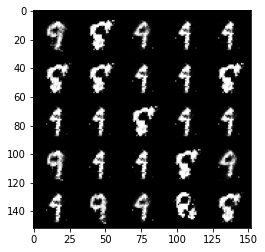

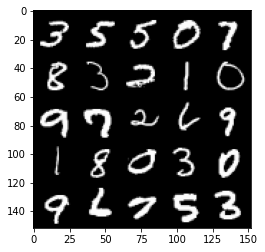

Step 62500: Generator loss: 6.885158419132236, discriminator loss: 0.10620896527916195


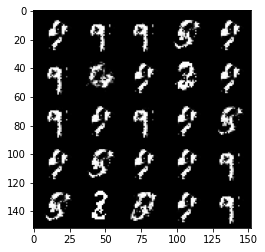

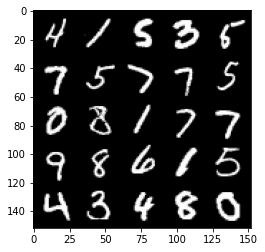

Step 63000: Generator loss: 6.571551310539247, discriminator loss: 0.12809954410511998


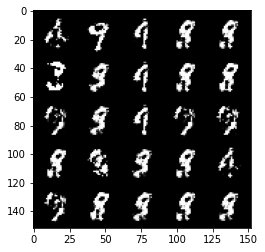

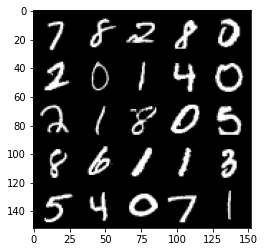

Step 63500: Generator loss: 5.675397397756576, discriminator loss: 0.14148918556421985


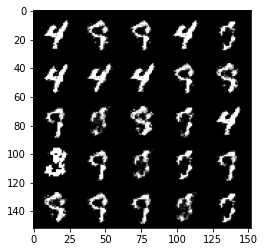

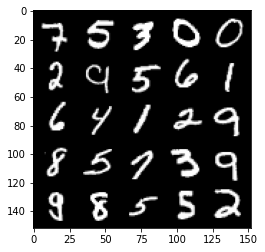

Step 64000: Generator loss: 6.178938422679909, discriminator loss: 0.12711088815703997


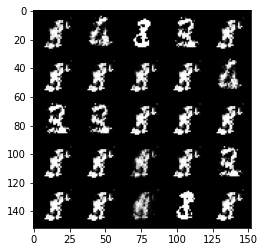

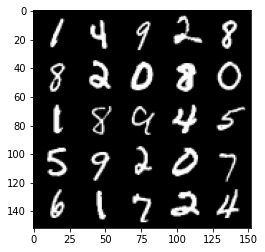

Step 64500: Generator loss: 6.969374722003939, discriminator loss: 0.0931680866363458


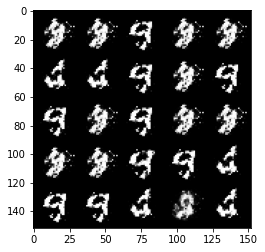

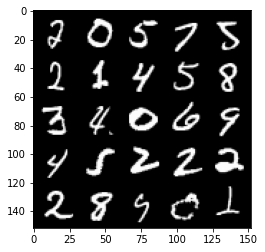

Step 65000: Generator loss: 5.7782791931629225, discriminator loss: 0.1866205982044339


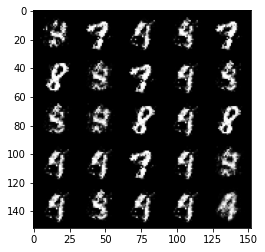

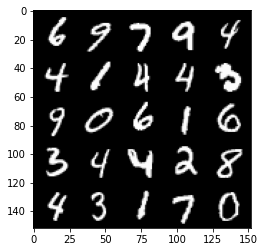

Step 65500: Generator loss: 5.09346000123024, discriminator loss: 0.16250411940366027


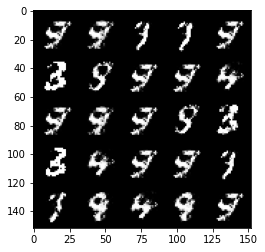

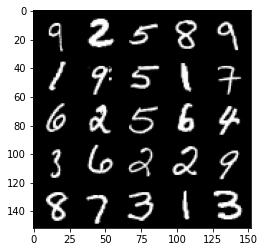

Step 66000: Generator loss: 5.389228669166566, discriminator loss: 0.13101350604742762


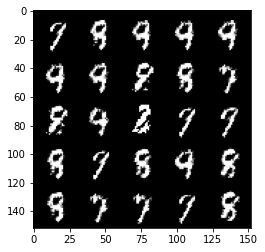

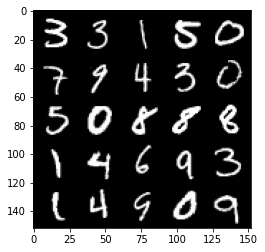

Step 66500: Generator loss: 6.018221318244933, discriminator loss: 0.1314183886181564


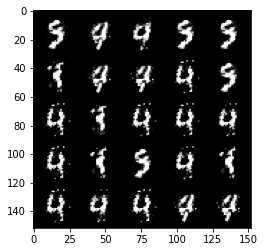

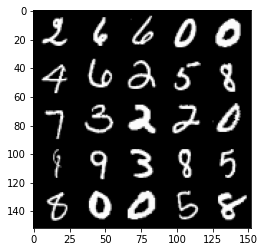

Step 67000: Generator loss: 5.705785731315609, discriminator loss: 0.116388781029731


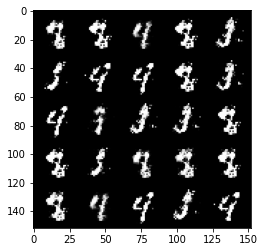

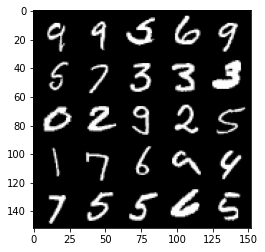

Step 67500: Generator loss: 5.37780797719956, discriminator loss: 0.1344330029264093


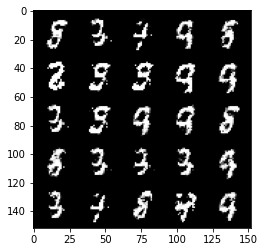

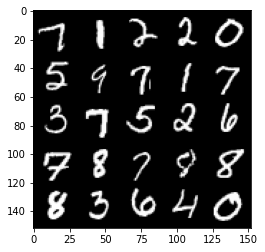

Step 68000: Generator loss: 5.327067658662792, discriminator loss: 0.15547257955744861


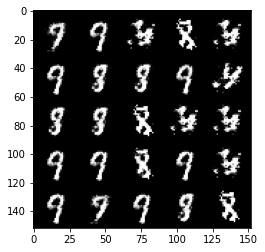

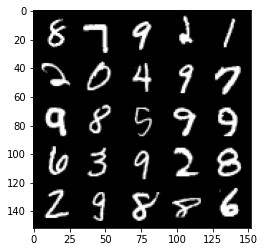

Step 68500: Generator loss: 4.890296899795526, discriminator loss: 0.13728004074841738


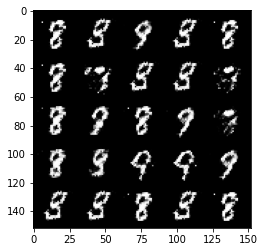

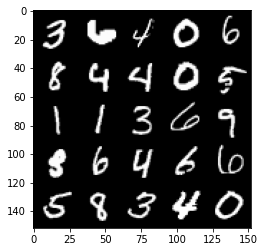

Step 69000: Generator loss: 5.944395957946781, discriminator loss: 0.11331291075423358


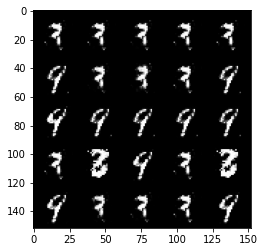

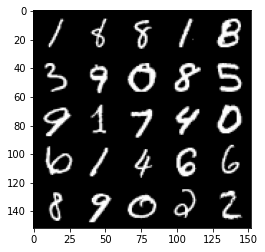

Step 69500: Generator loss: 6.734226790428161, discriminator loss: 0.13050545239355407


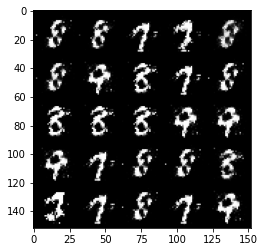

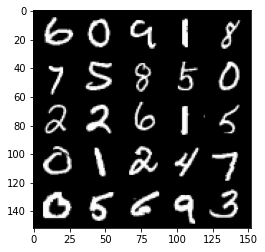

Step 70000: Generator loss: 6.379074326038355, discriminator loss: 0.1181142314323225


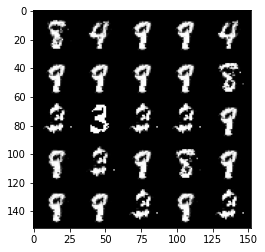

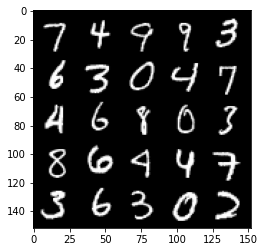

Step 70500: Generator loss: 7.7961624031066945, discriminator loss: 0.10433375381585207


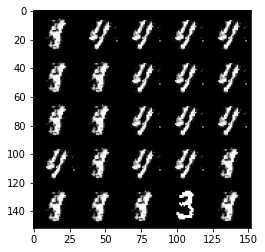

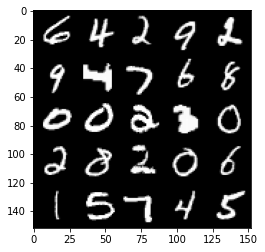

Step 71000: Generator loss: 6.834784831285474, discriminator loss: 0.13643282977305343


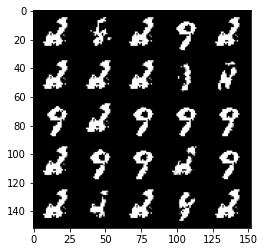

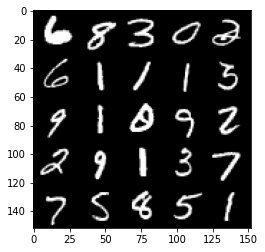

Step 71500: Generator loss: 6.535649010658267, discriminator loss: 0.1054797685109079


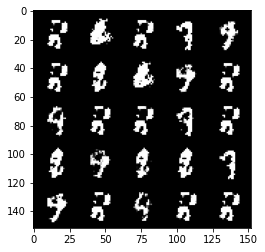

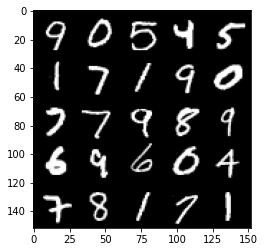

Step 72000: Generator loss: 6.697808764934539, discriminator loss: 0.1177985115610063


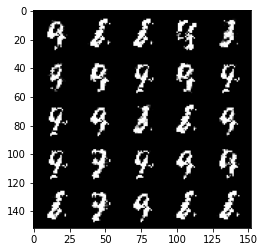

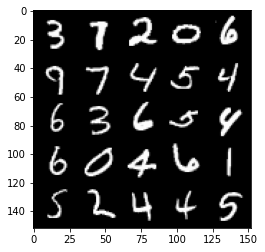

Step 72500: Generator loss: 6.479633067607884, discriminator loss: 0.1503501233048737


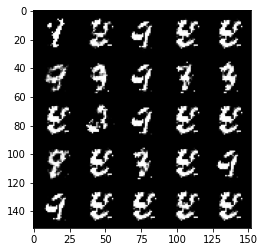

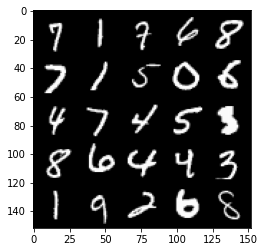

Step 73000: Generator loss: 6.857404887676234, discriminator loss: 0.14872315647453074


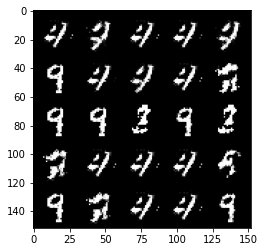

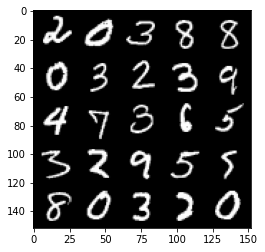

Step 73500: Generator loss: 5.432757109642023, discriminator loss: 0.12749311425909413


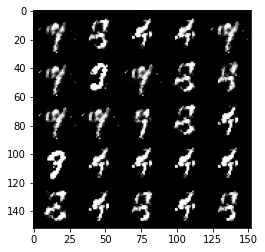

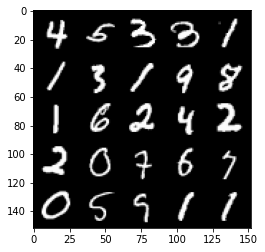

Step 74000: Generator loss: 6.194849062442781, discriminator loss: 0.1274544645436108


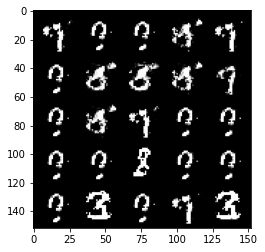

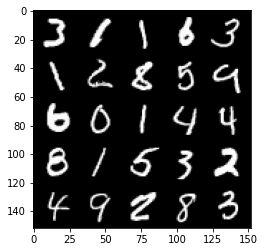

Step 74500: Generator loss: 6.616124610900878, discriminator loss: 0.1909885252378882


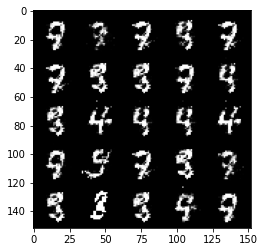

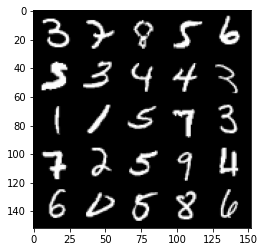

Step 75000: Generator loss: 5.859738601684569, discriminator loss: 0.1199546514246612


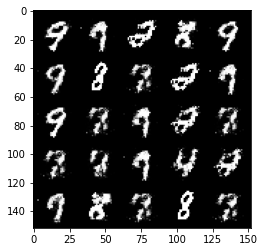

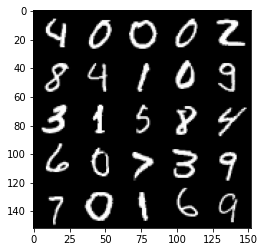

Step 75500: Generator loss: 6.084026591777802, discriminator loss: 0.11422817802801734


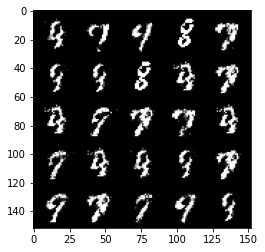

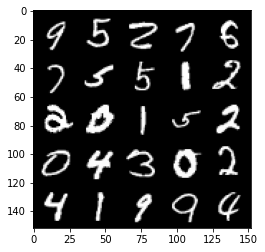

Step 76000: Generator loss: 6.096857220172888, discriminator loss: 0.1322444232273847


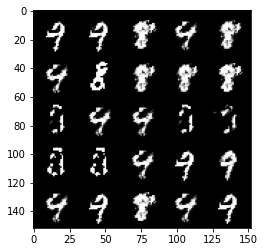

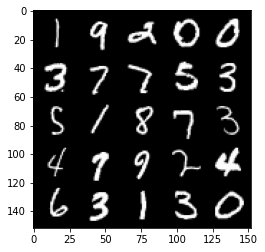

Step 76500: Generator loss: 6.287697422027591, discriminator loss: 0.1365253762565553


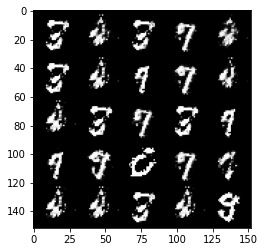

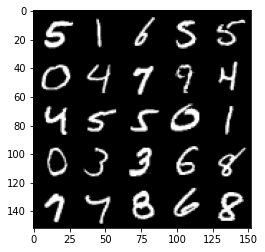

Step 77000: Generator loss: 6.272869067192077, discriminator loss: 0.15911789079383004


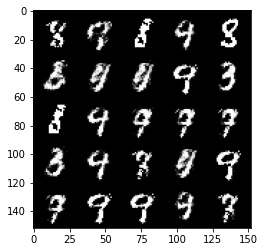

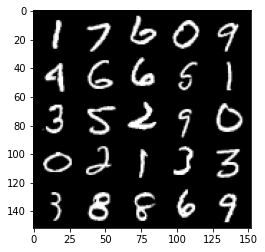

Step 77500: Generator loss: 5.569780313014986, discriminator loss: 0.13339079808443785


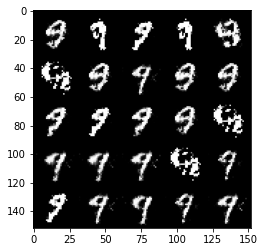

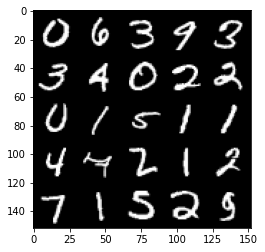

Step 78000: Generator loss: 6.486612502098084, discriminator loss: 0.13628843685425815


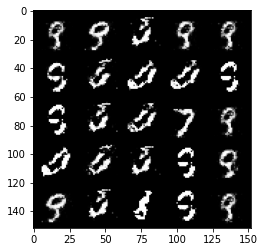

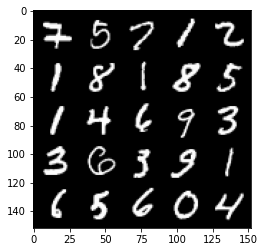

Step 78500: Generator loss: 5.9317758445739726, discriminator loss: 0.1125895217061043


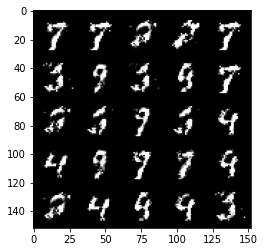

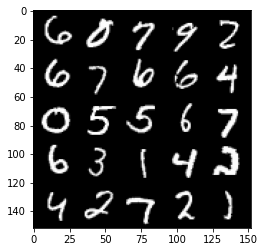

Step 79000: Generator loss: 7.302666315555573, discriminator loss: 0.09782916913740339


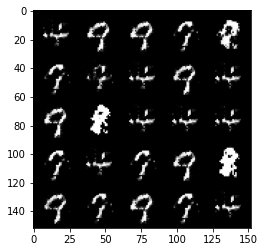

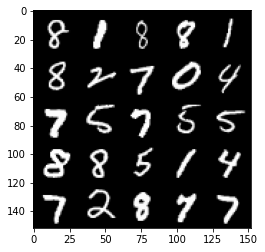

Step 79500: Generator loss: 6.912636754512789, discriminator loss: 0.09399468366708609


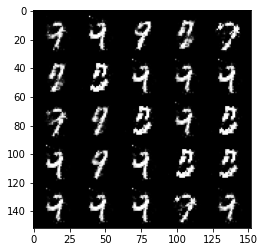

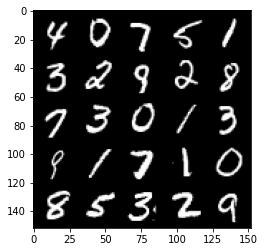

Step 80000: Generator loss: 7.519146750450136, discriminator loss: 0.15652799401991063


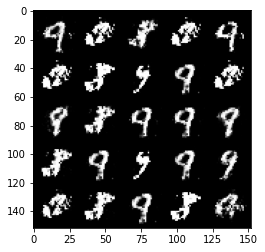

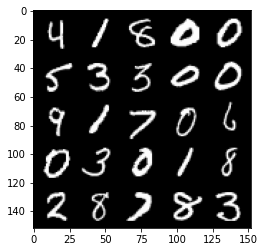

Step 80500: Generator loss: 5.6032114863395694, discriminator loss: 0.12333844057656822


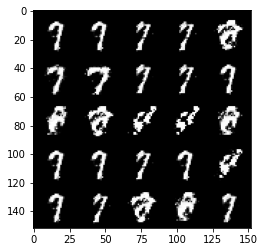

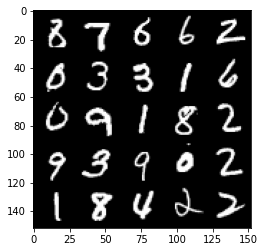

Step 81000: Generator loss: 7.386364926815036, discriminator loss: 0.11946803438290955


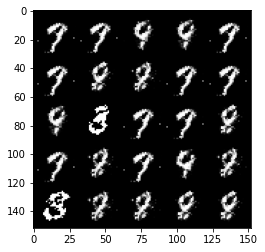

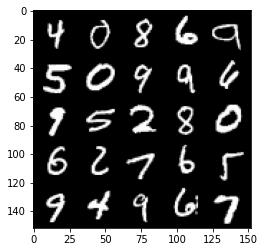

Step 81500: Generator loss: 6.7576617031097435, discriminator loss: 0.08204984026541934


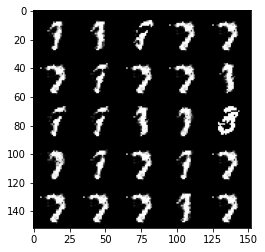

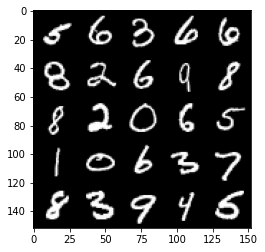

Step 82000: Generator loss: 7.559895709037775, discriminator loss: 0.10684486852958804


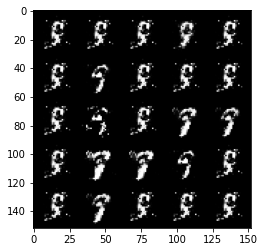

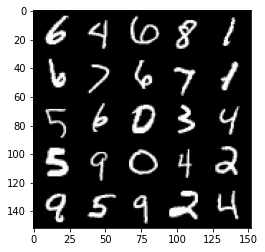

Step 82500: Generator loss: 7.631003501415247, discriminator loss: 0.07394480938138435


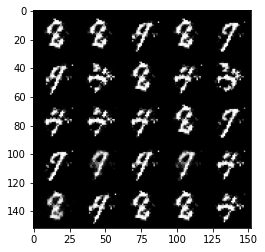

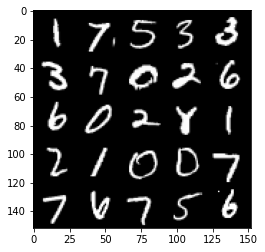

Step 83000: Generator loss: 8.237866359233848, discriminator loss: 0.08176898499531671


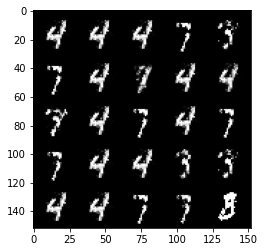

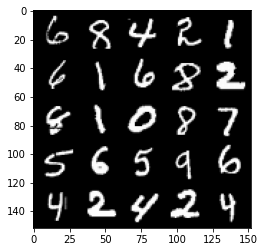

Step 83500: Generator loss: 6.640913676261896, discriminator loss: 0.07644197126384829


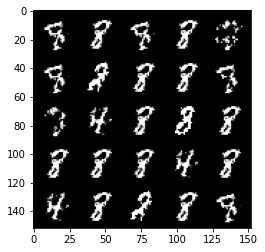

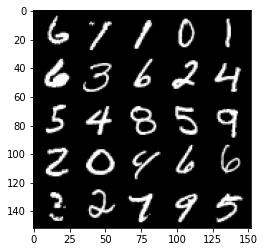

Step 84000: Generator loss: 7.737298134803773, discriminator loss: 0.11610173761914494


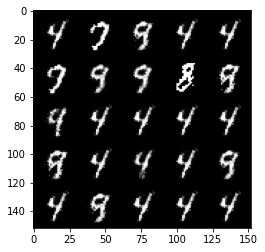

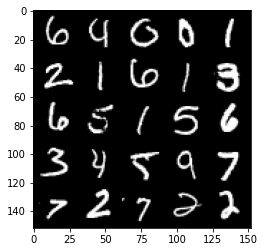

Step 84500: Generator loss: 8.117015109539027, discriminator loss: 0.14395121279743037


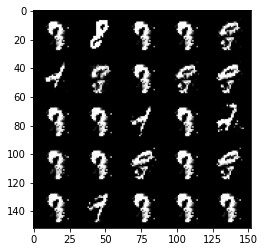

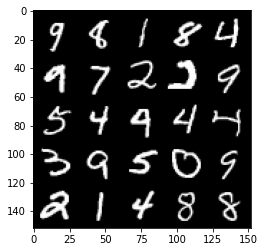

Step 85000: Generator loss: 6.747473245143882, discriminator loss: 0.11040798806957905


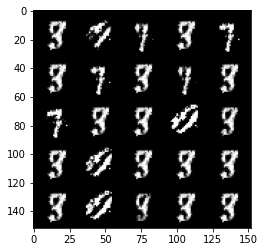

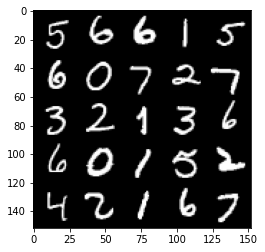

Step 85500: Generator loss: 7.104025547027588, discriminator loss: 0.10549164622835806


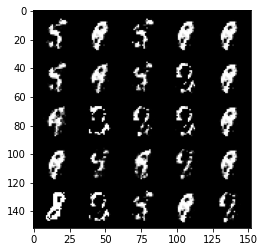

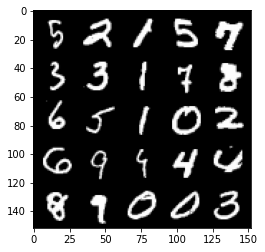

Step 86000: Generator loss: 6.941416688442238, discriminator loss: 0.12700837450474506


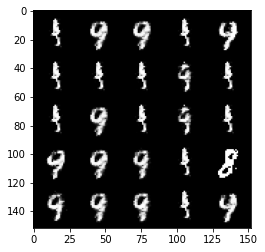

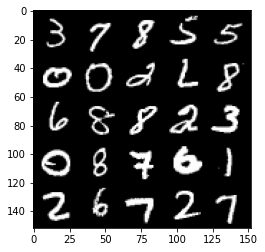

Step 86500: Generator loss: 7.451802258968357, discriminator loss: 0.11172215178795163


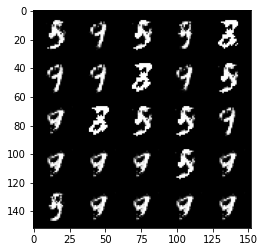

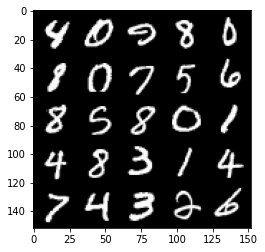

Step 87000: Generator loss: 7.16473240232468, discriminator loss: 0.0849935992569662


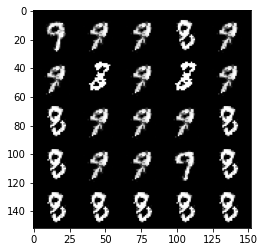

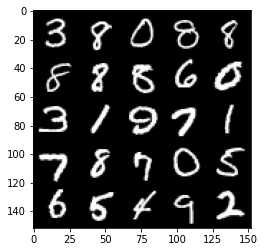

Step 87500: Generator loss: 9.043596245050441, discriminator loss: 0.23080351122003065


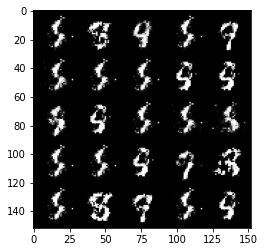

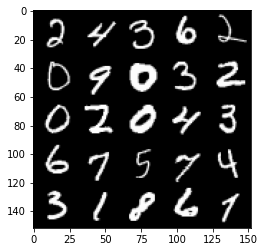

Step 88000: Generator loss: 6.306509923458102, discriminator loss: 0.1374252576418221


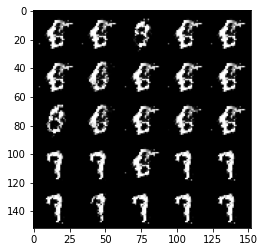

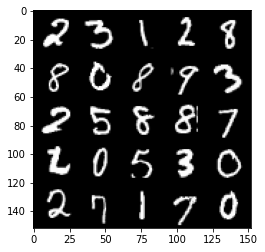

KeyboardInterrupt: ignored

In [118]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
gen_loss = False
for epoch in range(n_epochs):

    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        # DISCRIMINATOR LOSS UPDATE
        disc_opt.zero_grad()
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        disc_loss.backward(retain_graph=True)
        disc_opt.step()

        # GENERATOR LOSS UPDATE
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()

        mean_discriminator_loss += disc_loss.item() / display_step
        mean_generator_loss += gen_loss.item() / display_step

        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_images(fake)
            show_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
